In [1]:
pip install pandas matplotlib


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: C:\Users\LD\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [3]:
pip install kagglehub

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: C:\Users\LD\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("selfishgene/historical-hourly-weather-data")

print("Path to dataset files:", path)

C:\Users\LD\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


100%|██████████| 12.0M/12.0M [00:01<00:00, 9.34MB/s]

Extracting files...


Path to dataset files: C:\Users\LD\.cache\kagglehub\datasets\selfishgene\historical-hourly-weather-data\versions\2


In [19]:
import pandas as pd
import os

# Đường dẫn thư mục chứa file CSV 
data_path = r"C:\Users\LD\.cache\kagglehub\datasets\selfishgene\historical-hourly-weather-data\versions\2"

# Đọc dữ liệu từ các file CSV với đường dẫn đầy đủ
df1 = pd.read_csv(os.path.join(data_path, "city_attributes.csv"))
df2 = pd.read_csv(os.path.join(data_path, "humidity.csv"), parse_dates=['datetime'])
df3 = pd.read_csv(os.path.join(data_path, "pressure.csv"), parse_dates=['datetime'])
df4 = pd.read_csv(os.path.join(data_path, "temperature.csv"), parse_dates=['datetime'])
df5 = pd.read_csv(os.path.join(data_path, "weather_description.csv"), parse_dates=['datetime'])
df6 = pd.read_csv(os.path.join(data_path, "wind_direction.csv"), parse_dates=['datetime'])
df7 = pd.read_csv(os.path.join(data_path, "wind_speed.csv"), parse_dates=['datetime'])

# Kiểm tra kiểu dữ liệu của cột datetime
print(df2['datetime'].dtype)


datetime64[ns]


In [20]:
print(df2['datetime'].min())  # Ngày nhỏ nhất
print(df2['datetime'].max())  # Ngày lớn nhất

print(df2['datetime'].isnull().sum())  # Đếm giá trị null

2012-10-01 12:00:00
2017-11-30 00:00:00
0


In [21]:
df_filtered = df2[df2['datetime'].dt.year >= 2016]

# Hiển thị dữ liệu đã lọc
print(df_filtered)

                 datetime  Vancouver  Portland  San Francisco  Seattle  \
28476 2016-01-01 00:00:00       74.0      47.0           69.0     70.0   
28477 2016-01-01 01:00:00       78.0      47.0           74.0     86.0   
28478 2016-01-01 02:00:00      100.0      59.0           85.0     92.0   
28479 2016-01-01 03:00:00       97.0      55.0           80.0     92.0   
28480 2016-01-01 04:00:00       86.0      55.0           77.0     72.0   
...                   ...        ...       ...            ...      ...   
45248 2017-11-29 20:00:00        NaN      81.0            NaN     93.0   
45249 2017-11-29 21:00:00        NaN      71.0            NaN     87.0   
45250 2017-11-29 22:00:00        NaN      71.0            NaN     93.0   
45251 2017-11-29 23:00:00        NaN      71.0            NaN     87.0   
45252 2017-11-30 00:00:00        NaN      76.0            NaN     75.0   

       Los Angeles  San Diego  Las Vegas  Phoenix  Albuquerque  ...  \
28476         17.0       28.0       22.0

In [23]:
# 3. Trích xuất thông tin thời gian
# Giả sử 'datetime' là cột thời gian đã được chuyển thành kiểu datetime
df2['nam'] = df2['datetime'].dt.year
df2['thang'] = df2['datetime'].dt.month
df2['thu'] = df2['datetime'].dt.day_name()  
df2['gio'] = df2['datetime'].dt.hour

print(df2.to_string())

                 datetime  Vancouver  Portland  San Francisco  Seattle  Los Angeles  San Diego  Las Vegas  Phoenix  Albuquerque  Denver  San Antonio  Dallas  Houston  Kansas City  Minneapolis  Saint Louis  Chicago  Nashville  Indianapolis  Atlanta  Detroit  Jacksonville  Charlotte  Miami  Pittsburgh  Toronto  Philadelphia  New York  Montreal  Boston  Beersheba  Tel Aviv District  Eilat  Haifa  Nahariyya  Jerusalem   nam  thang        thu  gio
0     2012-10-01 12:00:00        NaN       NaN            NaN      NaN          NaN        NaN        NaN      NaN          NaN     NaN          NaN     NaN      NaN          NaN          NaN          NaN      NaN        NaN           NaN      NaN      NaN           NaN        NaN    NaN         NaN      NaN           NaN       NaN       NaN     NaN        NaN                NaN   25.0    NaN        NaN        NaN  2012     10     Monday   12
1     2012-10-01 13:00:00       76.0      81.0           88.0     81.0         88.0       82.0       22.0 

In [24]:
# 4. **Lấy mẫu lại dữ liệu**: Chuyển từ dữ liệu theo giờ thành **trung bình nhiệt độ theo ngày**.
# Lấy mẫu lại dữ liệu, tính trung bình nhiệt độ theo ngày
df_daily = df4.resample('D', on='datetime').mean()

# Hiển thị kết quả
print(df_daily.head())
# 5.**Nội suy dữ liệu bị thiếu** để điền nhiệt độ bị khuyết.
# Nội suy dữ liệu bị thiếu
df4['Miami'].interpolate(method='linear', inplace=True)
print(df4.isnull().sum())

             Vancouver    Portland  San Francisco     Seattle  Los Angeles  \
datetime                                                                     
2012-10-01  284.620769  282.118197     289.416642  281.767262   291.846501   
2012-10-02  286.145190  286.137728     292.958306  285.156888   295.890450   
2012-10-03  285.528125  289.599792     296.929167  287.673958   299.008542   
2012-10-04  284.373333  286.482500     295.687083  284.391667   295.997917   
2012-10-05  283.757292  288.286042     290.635417  284.756250   292.948333   

             San Diego   Las Vegas     Phoenix  Albuquerque      Denver  ...  \
datetime                                                                 ...   
2012-10-01  291.573495  293.358911  296.701739   285.476208  284.577328  ...   
2012-10-02  295.291472  297.248385  301.211968   289.771821  286.228571  ...   
2012-10-03  297.878750  300.691875  302.867083   291.205417  288.747500  ...   
2012-10-04  296.080833  301.820000  302.232917   293.

C:\Users\LD\AppData\Local\Temp\ipykernel_5452\4123701141.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df4['Miami'].interpolate(method='linear', inplace=True)


Nhiệt độ trung bình theo tháng:
month
2012-10    70.194254
2012-11    69.932679
2012-12    73.177989
2013-01    68.577348
2013-02    69.798790
             ...    
2017-07    78.930108
2017-08    82.068641
2017-09    69.806944
2017-10    61.055470
2017-11          NaN
Freq: M, Name: San Francisco, Length: 62, dtype: float64


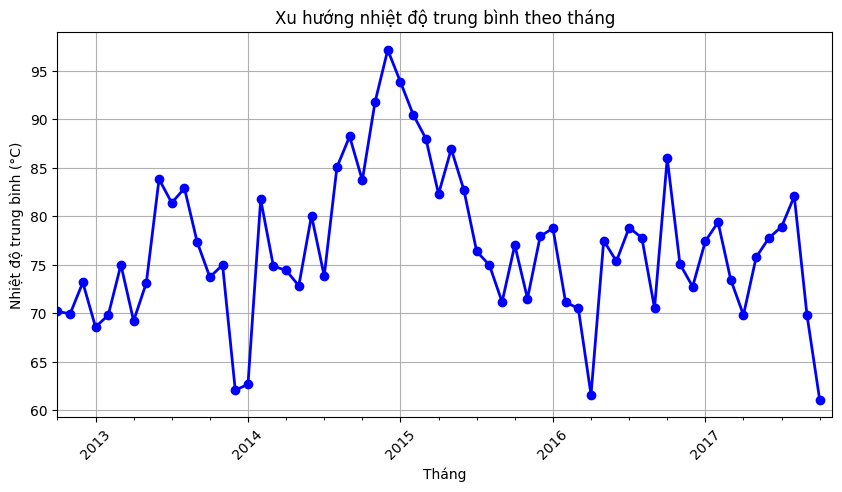

In [25]:
# 6. **Tính toán xu hướng thời gian**: Tính nhiệt độ trung bình theo tháng và vẽ biểu đồ.
import pandas as pd
import matplotlib.pyplot as plt

# Tính nhiệt độ trung bình theo tháng
df2['month'] = df2['datetime'].dt.to_period('M')  # Lấy tháng và năm dạng Period
monthly_avg = df2.groupby('month')['San Francisco'].mean()

print("Nhiệt độ trung bình theo tháng:")
print(monthly_avg)
# Vẽ biểu đồ xu hướng thời gian
plt.figure(figsize=(10, 5))
monthly_avg.plot(kind='line', marker='o', color='b', linestyle='-', linewidth=2, markersize=6)
plt.title("Xu hướng nhiệt độ trung bình theo tháng")
plt.xlabel("Tháng")
plt.ylabel("Nhiệt độ trung bình (°C)")
plt.grid(True)
plt.xticks(rotation=45)  # Xoay nhãn tháng để dễ nhìn hơn
plt.show()